# **ADVANCED LANE FINDING PROJECT**

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [ ]:
# We start by simply importing the relevant packages for this project
import pickle
import cv2
import glob
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg 

In [199]:
# 
images = glob.glob('camera_cal/calibration*.jpg')

## Creating `objpoints` and `imgpoints`

In [200]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (8,6), corners, ret)
        #write_name = 'corners_found'+str(idx)+'.jpg'
        #cv2.imwrite(write_name, img)
        cv2.imshow('img', img)
        cv2.waitKey(500)

cv2.destroyAllWindows()

## Calibration and Distortion Correction

camera_cal/calibration1.jpg
camera_cal/calibration10.jpg
camera_cal/calibration11.jpg
camera_cal/calibration12.jpg
camera_cal/calibration13.jpg
camera_cal/calibration14.jpg
camera_cal/calibration15.jpg
camera_cal/calibration16.jpg
camera_cal/calibration17.jpg
camera_cal/calibration18.jpg
camera_cal/calibration19.jpg
camera_cal/calibration2.jpg
camera_cal/calibration20.jpg
camera_cal/calibration3.jpg
camera_cal/calibration4.jpg
camera_cal/calibration5.jpg
camera_cal/calibration6.jpg
camera_cal/calibration7.jpg
camera_cal/calibration8.jpg
camera_cal/calibration9.jpg


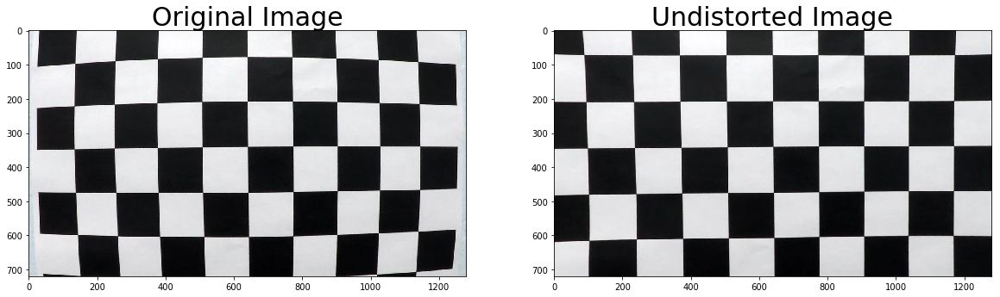

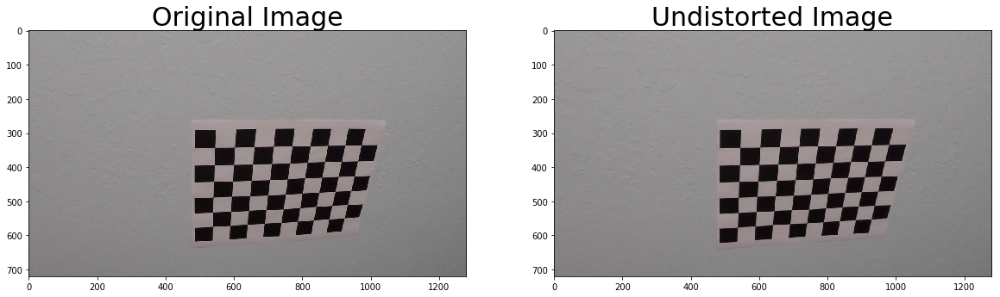

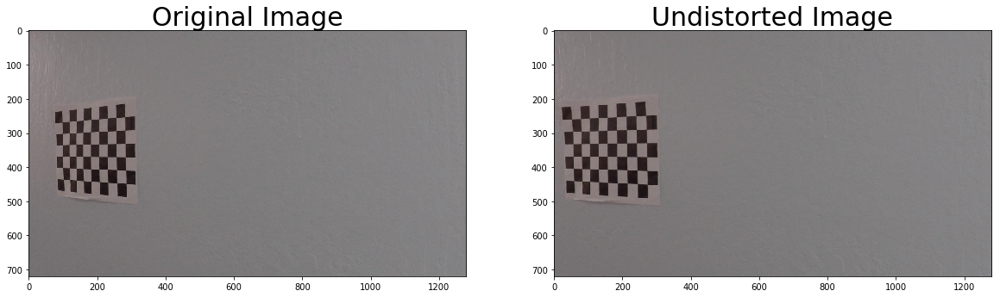

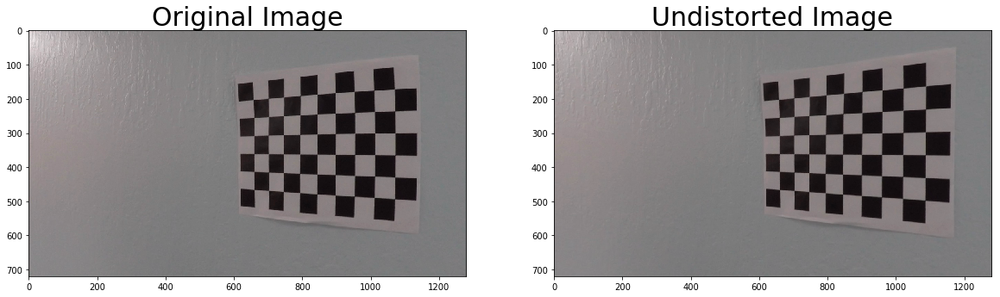

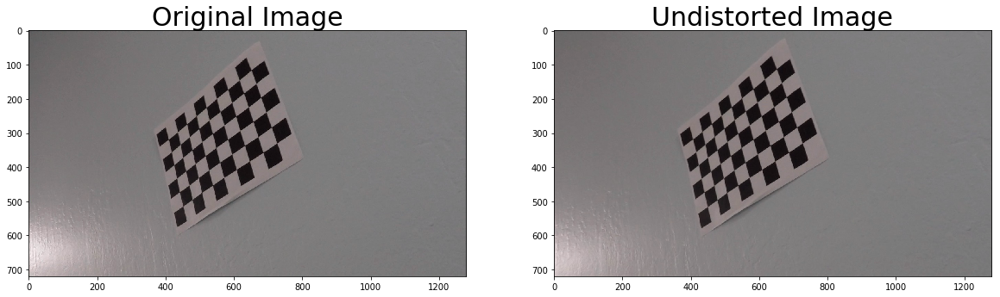

...

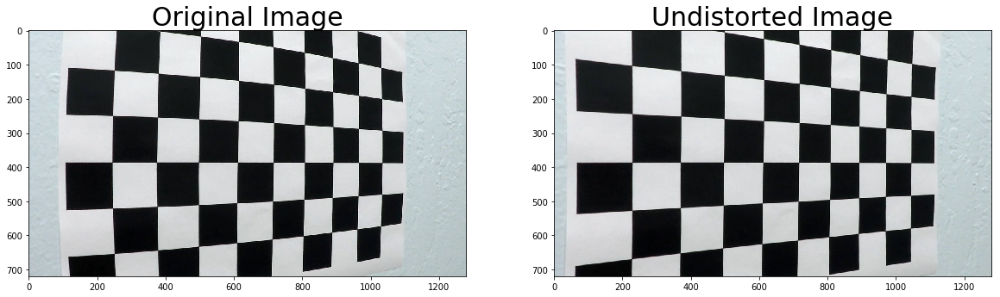

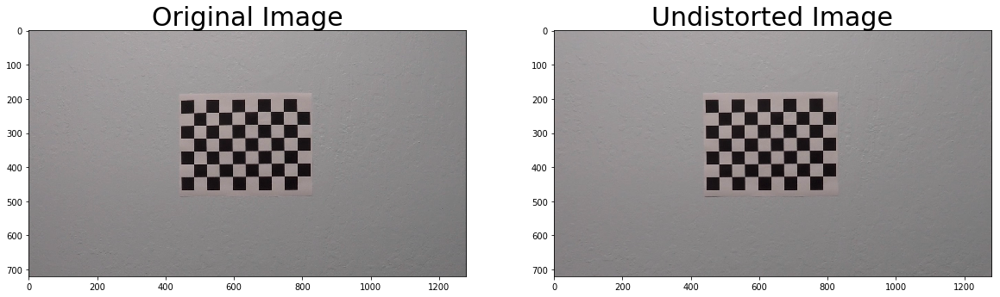

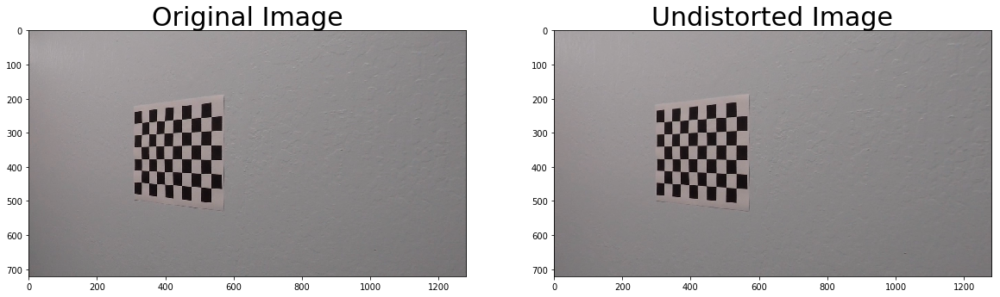

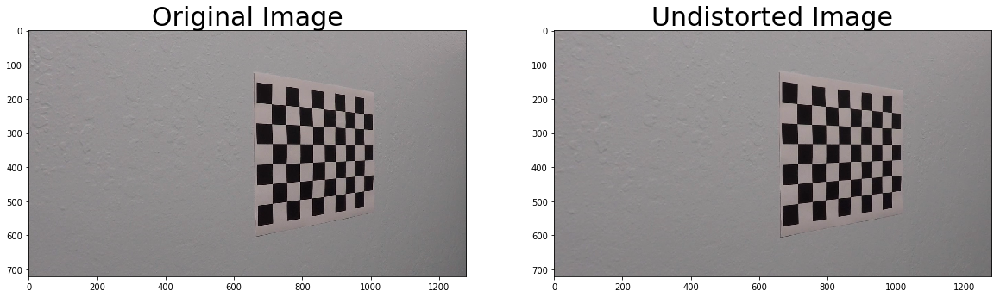

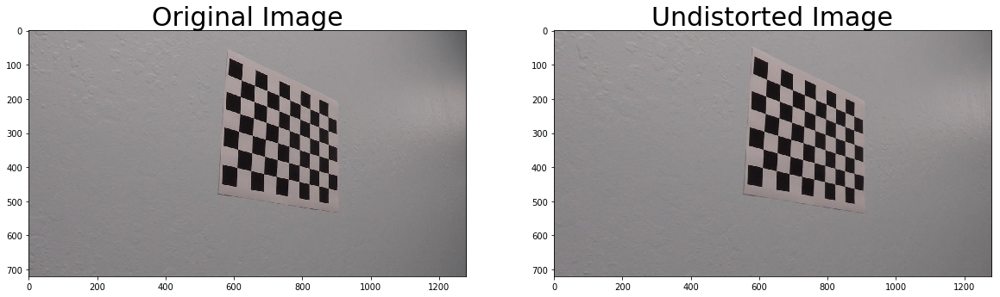

In [201]:
%matplotlib inline


for index, image_path in enumerate(images):
    print(image_path)
    # Test undistortion on an image
    img = cv2.imread(image_path)
    img_size = (img.shape[1], img.shape[0])

    # Do camera calibration given object points and image points
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)


    dst = cv2.undistort(img, mtx, dist, None, mtx)
    cv2.imwrite('undistorted_images/undistort' + str(index) + '.jpg',dst)

    # Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
    dist_pickle = {}
    dist_pickle["mtx"] = mtx
    dist_pickle["dist"] = dist
    pickle.dump( dist_pickle, open( "undistorted_images/undistort" + str(index) + ".p", "wb" ) )
    # Visualize undistortion
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(dst)
    ax2.set_title('Undistorted Image', fontsize=30)

## Create a function to find corners on chessboard

In [249]:
# Define a function that takes an image, number of x and y points, 
# camera matrix and distortion coefficients
def corners_unwarp(img, nx, ny, mtx, dist):
    # Use the OpenCV undistort() function to remove distortion
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    # Convert undistorted image to grayscale
    gray = cv2.cvtColor(undist, cv2.COLOR_BGR2GRAY)
    # Search for corners in the grayscaled image
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

    if ret == True:
        # If we found corners, draw them! (just for fun)
        cv2.drawChessboardCorners(undist, (nx, ny), corners, ret)
        # Choose offset from image corners to plot detected corners
        # This should be chosen to present the result at the proper aspect ratio
        # My choice of 100 pixels is not exact, but close enough for our purpose here
        offset = 100 # offset for dst points
        # Grab the image shape
        img_size = (gray.shape[1], gray.shape[0])

        # For source points I'm grabbing the outer four detected corners
        src = np.float32([corners[0], corners[nx-1], corners[-1], corners[-nx]])
        # For destination points, I'm arbitrarily choosing some points to be
        # a nice fit for displaying our warped result 
        # again, not exact, but close enough for our purposes
        dst = np.float32([[offset, offset], [img_size[0]-offset, offset], 
                                     [img_size[0]-offset, img_size[1]-offset], 
                                     [offset, img_size[1]-offset]])
        # Given src and dst points, calculate the perspective transform matrix
        M = cv2.getPerspectiveTransform(src, dst)
        # Warp the image using OpenCV warpPerspective()
        warped = cv2.warpPerspective(undist, M, img_size)
        
        # Save the image
        cv2.imwrite('undistorted_images/undistorted_corners.jpg',dst)
        
        dist_pickle = {}
        dist_pickle["mtx"] = mtx
        dist_pickle["dist"] = dist
        pickle.dump( dist_pickle, open( "undistorted_images/undistorted_corners.p", "wb" ) )
    
    # Return the resulting image and matrix
    return warped, M

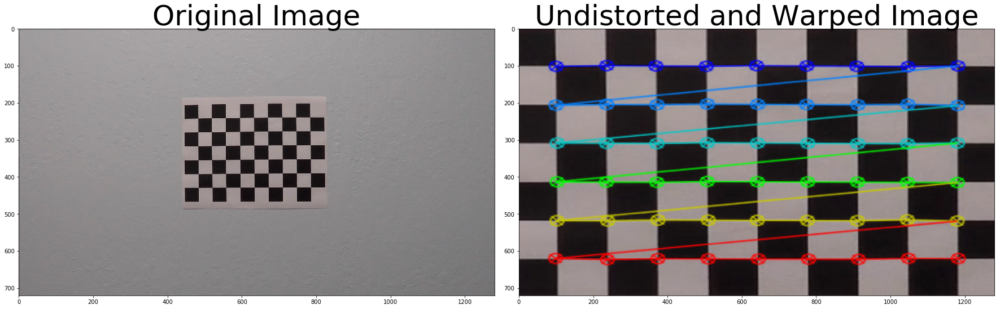

In [250]:
img = cv2.imread('camera_cal/calibration6.jpg')
img_size = (img.shape[1], img.shape[0])
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

top_down, perspective_M = corners_unwarp(img, 9, 6, mtx, dist)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(top_down)
ax2.set_title('Undistorted and Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Color and Gradient Thresholding

In this section, I test out a number of gradient and color thresholds. After seeing what works best, some of these are combined in one function which will be used in our final pipeline

### Gradient Threshold One

In [251]:
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Return the result
    return binary_output

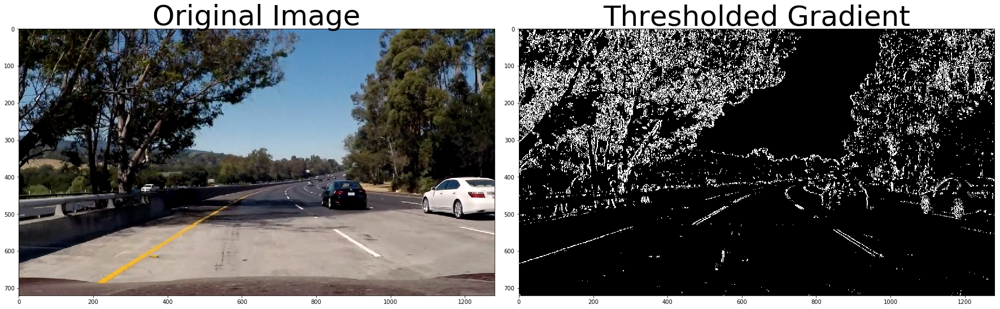

In [252]:
test_image = mpimg.imread('test_images/test5.jpg')
# Run the function
grad_binary = abs_sobel_thresh(test_image, orient='x', thresh_min=20, thresh_max=100)
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(test_image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(grad_binary, cmap='gray')
ax2.set_title('Thresholded Gradient', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Gradient Threshold 2

In [255]:
def dir_threshold(img, sobel_kernel=3, thresh=(0, 1.5)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    abs_graddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    # 5) Create a binary mask where direction thresholds are met
    binary_output = np.zeros_like(abs_graddir)
    binary_output[(abs_graddir >= thresh[0]) & (abs_graddir <= thresh[1])]  = 1
    # 6) Return this mask as your binary_output image
    return binary_output

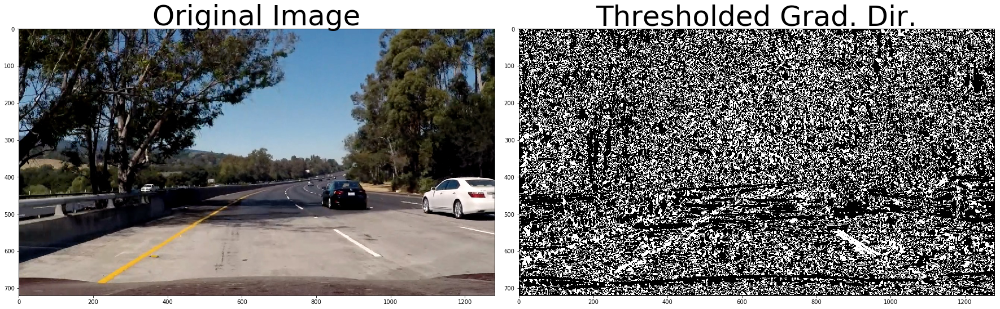

In [268]:
# Run the function
dir_binary = dir_threshold(test_image, sobel_kernel=15, thresh=(0.7, 1.3))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(test_image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(dir_binary, cmap='gray')
ax2.set_title('Thresholded Grad. Dir.', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Magnitude Thresholding

In [269]:
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Calculate the magnitude 
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scale_factor = np.max(gradmag)/255
    gradmag = (gradmag/scale_factor).astype(np.uint8)
    # 5) Create a binary mask where mag thresholds are met
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[-1])] = 1
    # 6) Return this mask as your binary_output image
    return binary_output

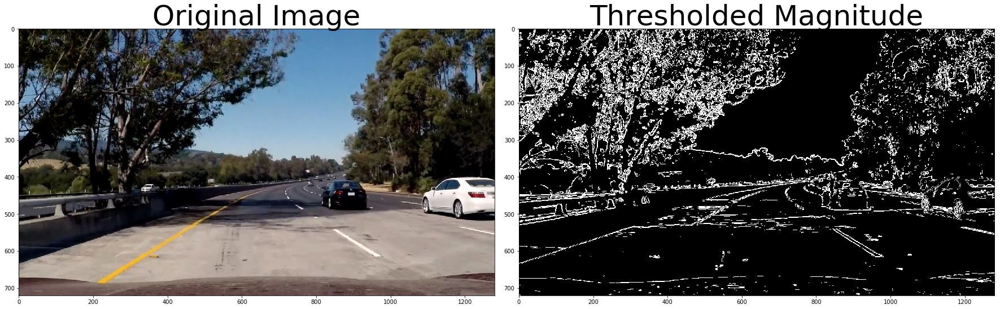

In [270]:
# Run the function
mag_binary = mag_thresh(test_image, sobel_kernel=3, mag_thresh=(30, 100))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(test_image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(mag_binary, cmap='gray')
ax2.set_title('Thresholded Magnitude', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### HLS Thresholding (s_channel)

In [271]:
def hls_s_select(img, thresh=(50, 255)):
    hls_s = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls_s[:,:,2]
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    return binary_output

In [272]:
test_images = glob.glob('test_images/*.jpg')

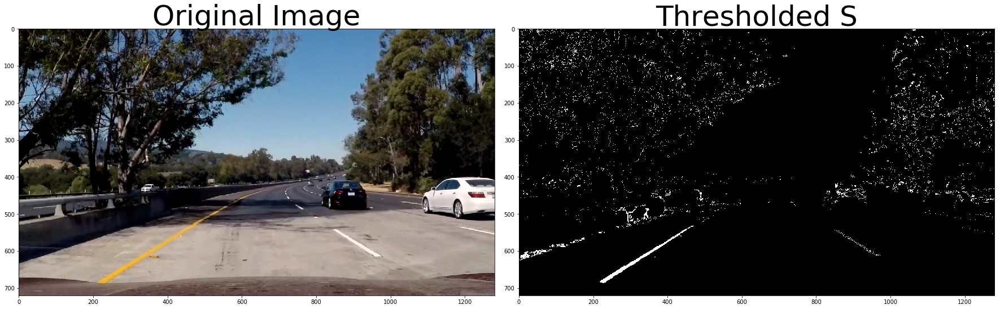

In [413]:
for image in test_images[6:7]:
    
    img = mpimg.imread(image)
    hls_binary = hls_s_select(img, thresh=(180, 250))

    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(hls_binary, cmap='gray')
    ax2.set_title('Thresholded S', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Luv Thresholding (l_channel)

In [287]:
def luv_select(img, thresh=(215, 255)):
    luv = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
    l_channel = luv[:,:,0]
    binary_output = np.zeros_like(l_channel)
    binary_output[(l_channel > thresh[0]) & (l_channel <= thresh[1])] = 1
    return binary_output

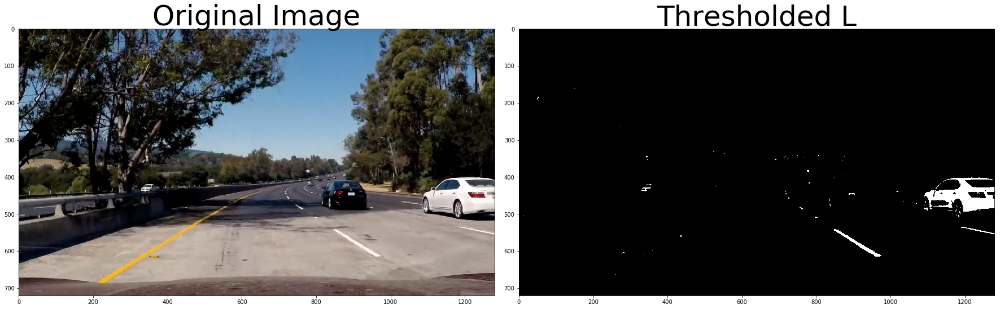

In [288]:
luv_binary = luv_select(test_image, thresh=(205, 255))

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(test_image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(luv_binary, cmap='gray')
ax2.set_title('Thresholded L', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Hls Thresholding (h_channel)

In [401]:
def hls_h_select(img, thresh=(210, 255)):
#     hls_h = cv2.cvtColor(img, cv2.COLOR_RGB2
    hls_h = img
    h_channel = hls_h[:,:,1]
    binary_output = np.zeros_like(h_channel)
    binary_output[(h_channel > thresh[0]) & (h_channel <= thresh[1])] = 1
    return binary_output

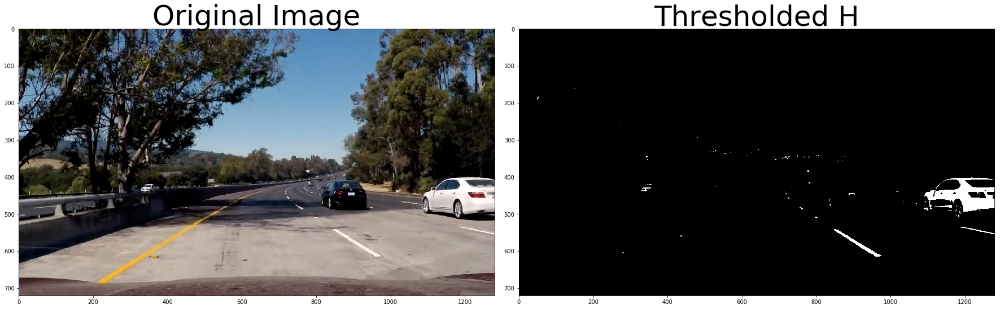

In [402]:
hls_h_binary = hls_h_select(test_image, thresh=(200, 255))

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(test_image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(hls_h_binary, cmap='gray')
ax2.set_title('Thresholded H', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## COMBINED COLOR THRESHOLD

In [444]:
def combined_threshold(img, s_thresh=(180, 250), l_thresh=(230, 255), h_thresh=(120, 195)):
    hls_s_binary = hls_s_select(img, thresh=s_thresh)
    luv_binary = luv_select(img, thresh=l_thresh)
#     hls_h_binary = hls_h_select(img, thresh=h_thresh)
    grad_binary = abs_sobel_thresh(test_image, orient='x', thresh_min=200, thresh_max=250)
    
#     color_binary = np.dstack(( np.zeros_like(luv_binary), hls_s_binary, luv_binary))
    
    combined_binary = np.zeros_like(luv_binary)
    combined_binary[(hls_s_binary == 1) | (luv_binary == 1) | grad_binary == 1] = 1
    
    return combined_binary

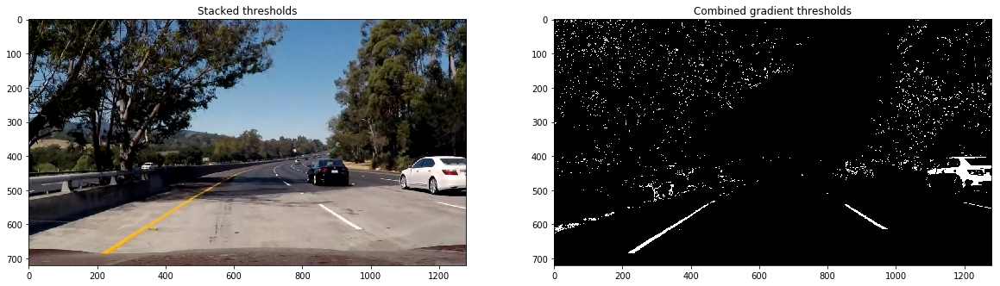

In [445]:
for image_path in test_images[6:7]:
    
    image = mpimg.imread(image_path)
    combined_binary = combined_threshold(image)

    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.set_title('Stacked thresholds')
    ax1.imshow(image, cmap='gray')

    ax2.set_title('Combined gradient thresholds')
    ax2.imshow(combined_binary, cmap='gray')

## Perspective Transform

In this part we write a function based on some chosen source and destination points which will transform our image.

In [446]:
def perspective_transform(img, src, dst):
    # Given src and dst points, calculate the perspective transform matrix
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    M = cv2.getPerspectiveTransform(src, dst)
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(undist, M, img_size)
    
    return warped, M

In [447]:
w,h = 1280,720
x,y = 0.5*w, 0.8*h
src = np.float32([[200./1280*w,720./720*h],
              [453./1280*w,547./720*h],
              [835./1280*w,547./720*h],
              [1100./1280*w,720./720*h]])
dst = np.float32([[(w-x)/2.,h],
              [(w-x)/2.,0.82*h],
              [(w+x)/2.,0.82*h],
              [(w+x)/2.,h]])

In [448]:
print(src)
print('---')
print(dst)

[[  200.   720.]
 [  453.   547.]
 [  835.   547.]
 [ 1100.   720.]]
---
[[ 320.          720.        ]
 [ 320.          590.40002441]
 [ 960.          590.40002441]
 [ 960.          720.        ]]


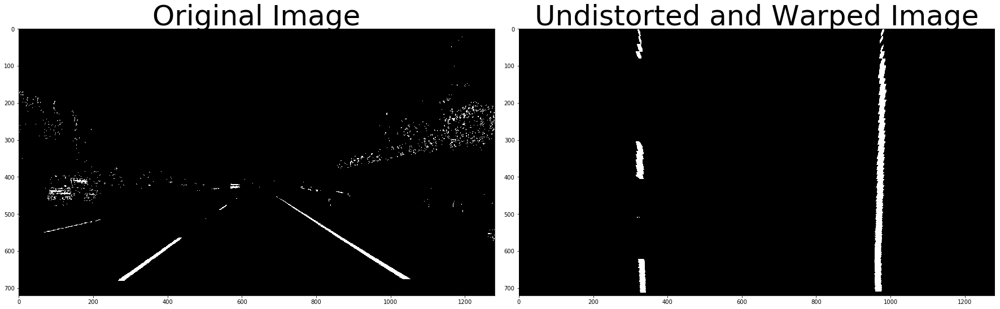

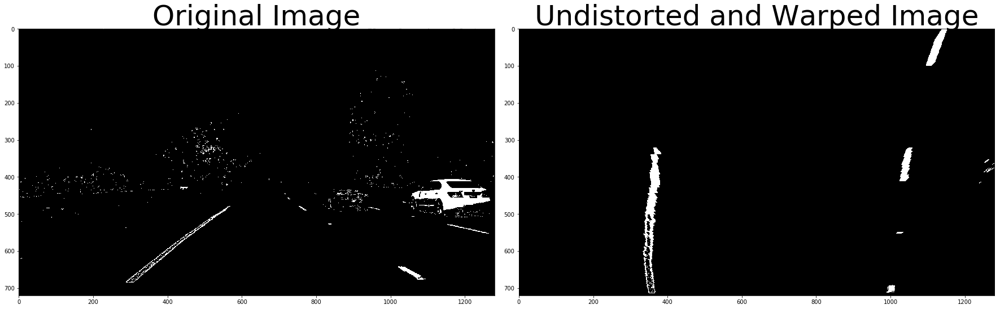

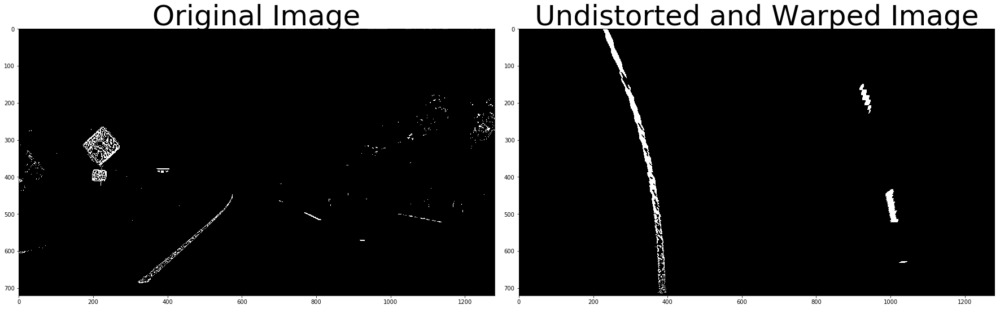

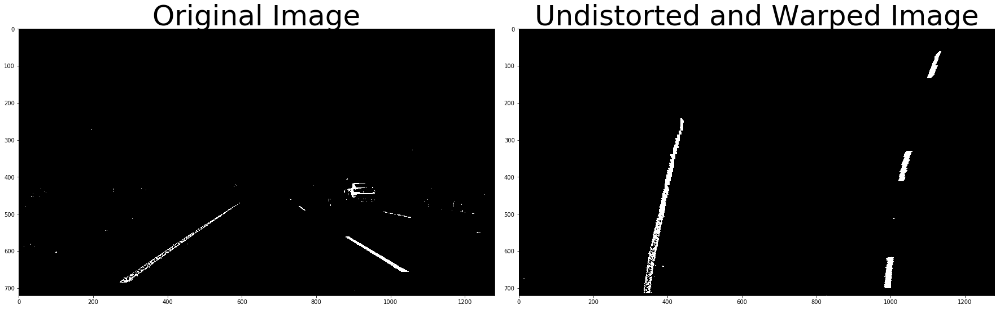

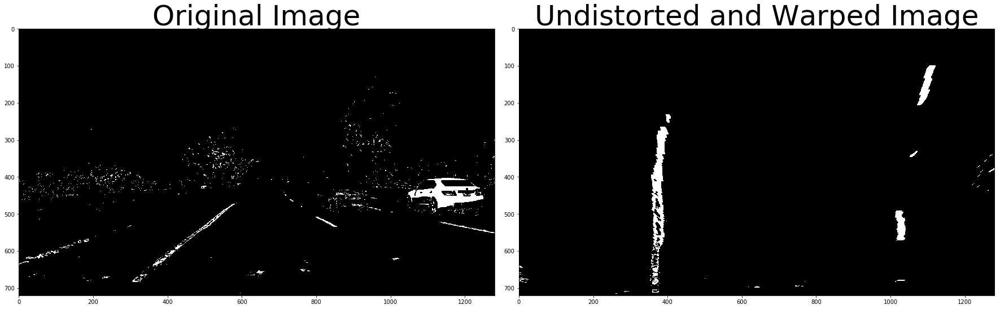

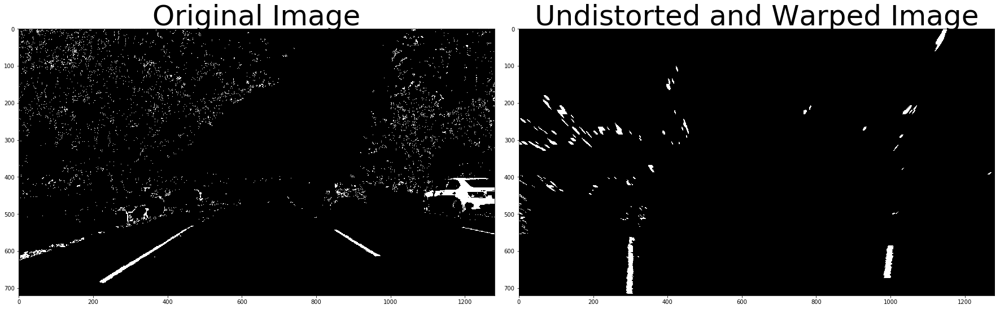

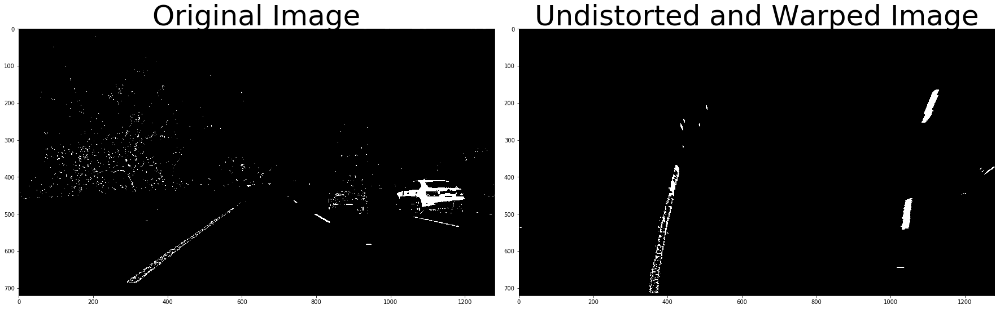

In [449]:
for image_path in test_images[1:]:
    
    img = mpimg.imread(image_path)
    thresholded = combined_threshold(img)
    img_size = (img.shape[1], img.shape[0])
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

    top_down, perspective_M = perspective_transform(thresholded, src, dst)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(thresholded, cmap='gray')
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(top_down, cmap='gray')
    ax2.set_title('Undistorted and Warped Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Lane Line Identification

We now work on identifying the lane lines. We first write a function which applies the sliding windows approach.

In [472]:
def sliding_windows(warped_image):
    # make a histogram
    histogram = np.sum(warped_image[warped_image.shape[0]//2:,:], axis=0)
    out_img = np.dstack((warped_image, warped_image, warped_image))*255
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines

    midpoint = 640
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(warped_image.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = warped_image.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = warped_image.shape[0] - (window+1)*window_height
        win_y_high = warped_image.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, cropped_top_down.shape[0]-1, cropped_top_down.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
#     plt.imshow(out_img)
#     plt.plot(left_fitx, ploty, color='yellow')
#     plt.plot(right_fitx, ploty, color='yellow')
#     plt.xlim(0, 1280)
#     plt.ylim(720, 0)
    
    return left_fit, right_fit, leftx, lefty, rightx, righty

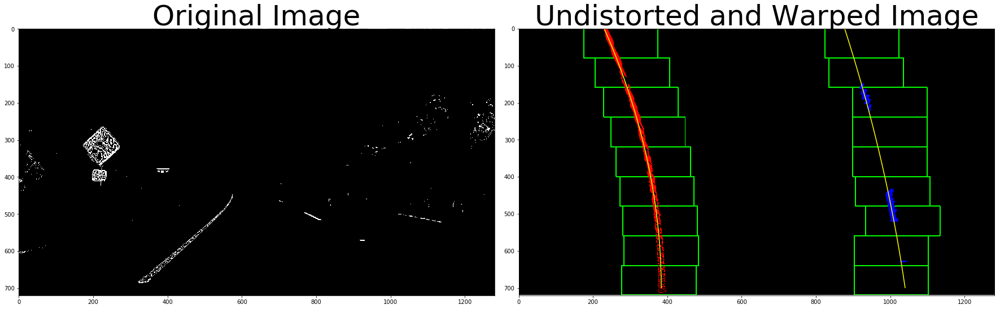

In [471]:
for image_path in test_images[3:4]:
    img = mpimg.imread(image_path)
    thresholded = combined_threshold(img)
    img_size = (img.shape[1], img.shape[0])
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

    top_down, perspective_M = perspective_transform(thresholded, src, dst)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(thresholded, cmap='gray')
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(top_down, cmap='gray')
    ax2.set_title('Undistorted and Warped Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    left_fit, right_fit, leftx, lefty, rightx, righty = sliding_windows(top_down)

## FINDING THE LINES AFTER ALREADY DOING THE WINDOES ONCE

In [456]:
def find_from_past(warped, leftx, lefty, rightx, righty):
    # Assume you now have a new warped binary image 
    # from the next frame of video (also called "binary_warped")
    # It's now much easier to find line pixels!
#     nonzero = top_down.nonzero()
#     nonzeroy = np.array(nonzero[0])
#     nonzerox = np.array(nonzero[1])
#     margin = 100
#     left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
#     right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
#     leftx = nonzerox[left_lane_inds]
#     lefty = nonzeroy[left_lane_inds] 
    
    if (leftx.size == 0) or (lefty.size == 0):
        return None, None
    
#     rightx = nonzerox[right_lane_inds]
#     righty = nonzeroy[right_lane_inds]
    
    if (rightx.size == 0) or (righty.size == 0):
        return None, None
    
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, warped.shape[0]-1, warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((warped, warped, warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
#     plt.imshow(result)
#     plt.plot(left_fitx, ploty, color='yellow')
#     plt.plot(right_fitx, ploty, color='yellow')
#     plt.xlim(0, 1280)
#     plt.ylim(720, 0)
    
    return left_fit, right_fit


(array([  2.96110483e-05,  -8.98436188e-03,   3.24046640e+02]),
 array([ -1.28890915e-05,  -1.24222527e-02,   9.78438672e+02]))

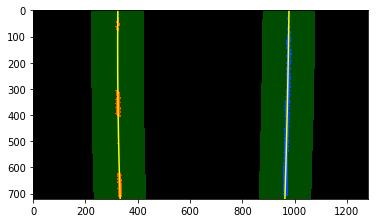

In [455]:
find_from_past(top_down, leftx, lefty, rightx, righty)

In [461]:
def fill_lane(img, warped, left_fit, right_fit):
    img_size = (img.shape[1], img.shape[0])
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    ploty = np.linspace(0, warped.shape[0]-1, warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    Minv = cv2.getPerspectiveTransform(dst, src)

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(img, 1, newwarp, 0.3, 0)
   
    # Compute radius of curvature
    y_eval = np.max(ploty)
    left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    average_curverad = (left_curverad + right_curverad)/2
    
    curve_string = "Radius of curvature: %.2f" % average_curverad
    
    # Compute the offset from center
    lane_center = (left_fitx[warped.shape[0]-1] + right_fitx[warped.shape[0]-1])/2
    xm_per_pix = 3.7/700
    center_offset_pixels = abs(img_size[0]/2 - lane_center)
    center_offset_mtrs = xm_per_pix*center_offset_pixels
    offset_string = "Center offset: %.2f m" % center_offset_mtrs

    cv2.putText(result, curve_string, (100, 100), cv2.FONT_HERSHEY_SCRIPT_SIMPLEX, 2.5, (255, 255, 255), thickness=5)
    cv2.putText(result, offset_string, (100, 200), cv2.FONT_HERSHEY_SCRIPT_SIMPLEX, 2.5, (255, 255, 255), thickness=5)
    
#     plt.imshow(result)
    
    return result

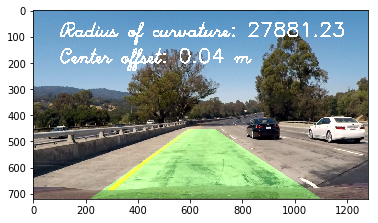

In [460]:
test_img = mpimg.imread('test_images/test1.jpg')
result = fill_lane(test_img, top_down, left_fit, right_fit)

In [462]:
def average_lines(previous, new):
    frames = 10
    
    if new is None:
        # No line was detected        
        if len(previous) == 0:
            # If there are no previous lines, return None
            return previous, None
        else:
            # Else return the last line
            return previous, previous[-1]
    else:
        if len(previous) < frames:
            # we need at least num_frames frames to average over
            previous.append(new)
            return previous, new
        else:
            # average over the last num_frames frames
            previous[0:frames-1] = previous[1:]
            previous[frames-1] = new
            new = np.zeros_like(new)
            for i in range(frames):
                new += previous[i]
            new /= frames
            return previous, new

In [473]:
def pipeline_final(img):
    # global variables to store the polynomial coefficients of the line detected in the last frame
    global polyfit_right
    global polyfit_left
    
    # global variables to store the line coordinates in previous n (=4) frames
    global past_right_lines
    global past_left_lines
    
    # global variable which contains running average of the mean difference between left and right lanes
    global running_mean_diff
    
    img_size = (img.shape[1], img.shape[0])
    
    # apply thresholding
    thresholded = combined_threshold(img)

    # warp the image.
    warped, M = perspective_transform(thresholded, src, dst)
    out_img = np.dstack((warped, warped, warped))*255
    
    nonzeros = warped.nonzero()
    nonzerosy = nonzeros[0]
    nonzerosx = nonzeros[1]
    
    rows = warped.shape[0]
    y_points = np.linspace(0, rows-1, rows)
    
    if not polyfit_left or not polyfit_right:
        # If the polynomial coefficients of the previous frames are None then perform a sliding windows force search
        sliding = True
        left_fit, right_fit, leftx, lefty, rightx, righty = sliding_windows(warped)
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    else:
        # Else search in a margin of 100 pixels on each side of the pervious polynomial fit
        sliding = False
        margin = 100
        
        ___ = find_from_past()
        
        left_fitx = polyfit_left[0]*nonzerosy**2 + polyfit_left[1]*nonzerosy + polyfit_left[2]
        left_coordinates = ((nonzerosx >= left_x_predictions - margin) & (nonzerosx <= left_x_predictions + margin)).nonzero()[0]

        right_x_predictions = polyfit_right[0]*non_zeros_y**2 + polyfit_right[1]*non_zeros_y + polyfit_right[2]
        right_coordinates = ((non_zeros_x >= right_x_predictions - margin) & (non_zeros_x <= right_x_predictions + margin)).nonzero()[0]
        
        left_x_predictions, right_x_predictions = get_line_predictions(non_zeros_x, non_zeros_y, left_coordinates, right_coordinates, num_rows)
    
    if (left_fitx is None) or (right_fitx is None):
        if not sliding:
            left_fit, right_fit, leftx, lefty, rightx, righty = sliding_windows(warped)
            left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
            right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
            
    no_fit = False
            
    if (left_fitx is None) or (right_fitx is None):
        no_fit = True
    else:
        mean_difference = np.mean(right_fitx - left_fitx)
        
        if running_mean_diff == 0:
            running_mean_diff = mean_difference
        
        if (mean_difference < 0.7*running_mean_diff) or (mean_difference > 1.3*running_mean_diff):
            no_fit = True
            if not sliding:
                left_fit, right_fit, leftx, lefty, rightx, righty = sliding_windows(warped)
                left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
                right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
                
                if (left_fitx is None) or (right_fitx is None):
                    no_fit = True
                else:
                    mean_difference = np.mean(right_fitx - left_fitx)
                    if (mean_difference < 0.7*running_mean_diff) or (mean_difference > 1.3*running_mean_diff):
                        no_fit = True
                    else:
                        no_fit = False
        else:
            no_fit = False
            
    if no_fit:
        polyfit_left = None
        polyfit_right = None
        if len(past_left_lines) == 0 and len(past_right_lines) == 0:
            return img
        else:
            left_fitx = past_left_lines[-1]
            right_fitx = past_right_lines[-1]
    else:
        past_left_lines, left_fitx = average_lines(past_left_lines, left_fitx)
        past_right_lines, right_fitx = average_lines(past_right_lines, right_fitx)
        mean_difference = np.mean(right_fitx - left_fitx)
        running_mean_diff = 0.9*running_mean_diff + 0.1*mean_difference
    
    left_line_window = np.array(np.transpose(np.vstack([left_fitx, y_points])))
    right_line_window = np.array(np.flipud(np.transpose(np.vstack([right_fitx, y_points]))))
    
    # filling the lines
    result = fill_lane(img, warped, left_fit, right_fit)
    
    return result

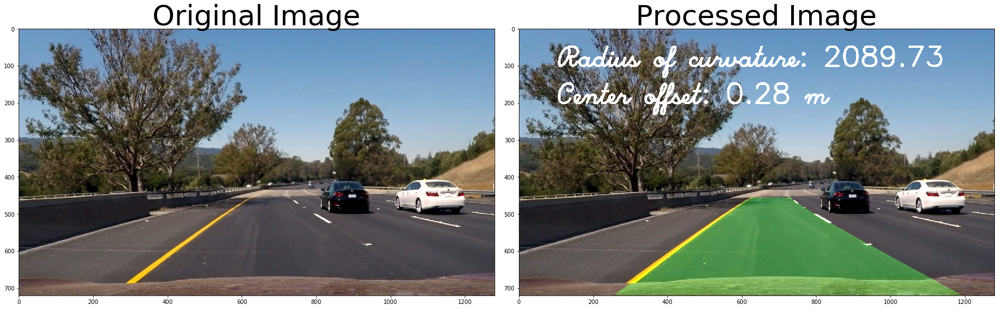

In [474]:
img = mpimg.imread('test_images/test6.jpg')

# Reinitialize some global variables.
polyfit_left = None
polyfit_right = None
past_left_lines = []
past_right_lines = []
running_mean_diff = 0

# Apply pipeline
processed = pipeline_final(img)

# Plot the 2 images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(processed, cmap='gray')
ax2.set_title('Processed Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## SET UP FOR VIDEO TESTING

In [475]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [476]:
# Reinitialize some global variables.
polyfit_left = None
polyfit_right = None
past_good_right_lines = []
past_good_left_lines = []
running_mean_difference_between_lines = 0

clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(pipeline_final) #NOTE: this function expects color images!!
%time white_clip.write_videofile('project_video_output.mp4', audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [02:37<00:00,  7.94it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 4min 13s, sys: 32 s, total: 4min 45s
Wall time: 2min 38s
